In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob

In [2]:
plate_cascade = cv2.CascadeClassifier('indian_license_plate.xml')

In [294]:
from time import perf_counter
import math
def detect_plate(img, text=''): # the function detects and perfors blurring on the number plate.
    plate_img = img.copy()
    roi = img.copy()
    t1_start = perf_counter()
    plate_rect = plate_cascade.detectMultiScale(plate_img, scaleFactor = 1.2, minNeighbors = 7) # detects numberplates and returns the coordinates and dimensions of detected license plate's contours.
    t1_stop = perf_counter()
    print("Elapsed time:", (t1_stop-t1_start)*1000)
    print("DimentionPredict:",plate_rect)
    for (x,y,w,h) in plate_rect:
        roi_ = roi[y:y+h, x:x+w, :] # extracting the Region of Interest of license plate for blurring.
        plate = roi[y:y+h, x:x+w, :]
        cv2.rectangle(plate_img, (x+2,y), (x+w-3, y+h-5), (51,181,155), 1) # finally representing the detected contours by drawing rectangles around the edges.
    
    if text!='':
        plate_img = cv2.putText(plate_img, text, (x-w//2,y-h//2), 
                                cv2.FONT_HERSHEY_COMPLEX_SMALL , 0.5, (51,181,155), 1, cv2.LINE_AA)
        
    return plate_img, plate

In [4]:
def display(img_, title=''):
    img = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    fig = plt.figure(figsize=(10,6))
    ax = plt.subplot(111)
    ax.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()

In [353]:
import glob
import cv2
Xuntilted = [cv2.imread(file) for file in glob.glob("C:/Users/user/OneDrive/Desktop/New/car/untilted/*.png")]

In [6]:
output_img, plate = detect_plate(Xuntilted[0])

DimentionPredict: [[129 125 131  33]]


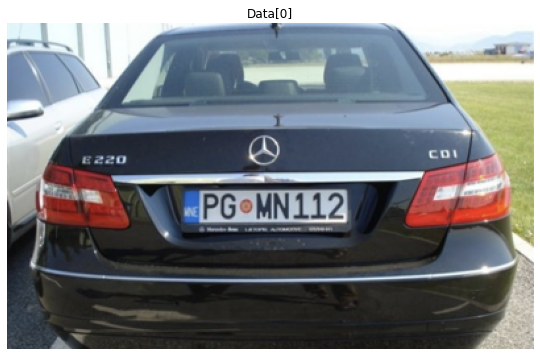

In [7]:
display(Xuntilted[0],"Data[0]")

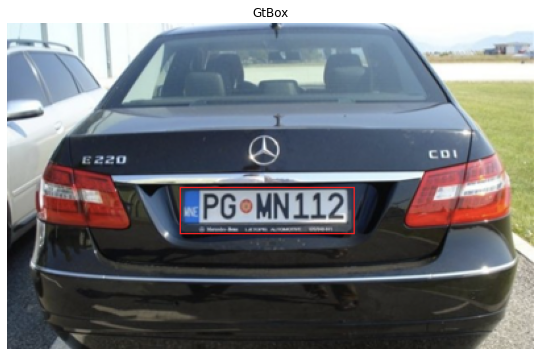

In [8]:
a=cv2.rectangle(Xuntilted[0], (131,125), (131+132, 125+35), (37,37,245), 1)
display(a,"GtBox")

In [9]:
gt_box = [131, 125, 132, 35]
pred_box = [129, 125, 131, 33]
def intersection_over_union(gt_box, pred_box):
    inter_box_top_left = [max(gt_box[0], pred_box[0]), max(gt_box[1], pred_box[1])]
    inter_box_bottom_right = [min(gt_box[0]+gt_box[2], pred_box[0]+pred_box[2]), min(gt_box[1]+gt_box[3], pred_box[1]+pred_box[3])]

    inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
    inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]

    intersection = inter_box_w * inter_box_h
    union = gt_box[2] * gt_box[3] + pred_box[2] * pred_box[3] - intersection
    
    iou = intersection / union

    return iou, intersection, union

In [10]:
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.9084507042253521 4257 4686


In [11]:
# for i in range(len(Xuntilted)):
#     output_img, plate = detect_plate(Xuntilted[i])

In [12]:
# 129 125 131  33

In [13]:
output_img, plate = detect_plate(Xuntilted[1])

DimentionPredict: [[131 207 147  37]
 [103 114 223  56]]


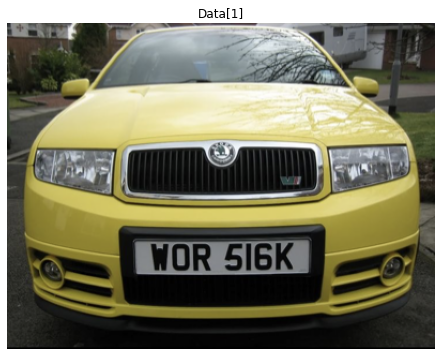

In [14]:
display(Xuntilted[1],"Data[1]")

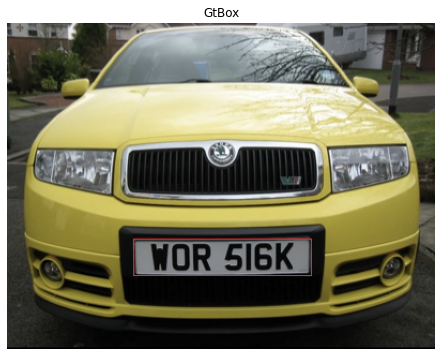

In [15]:
#cv2.rectangle(รูป, (ค่าx,ค่าy), (กว้าง, ยาว), (37,37,245), 1)
a=cv2.rectangle(Xuntilted[1], (118,202), (284, 236), (37,37,245), 1)
display(a,"GtBox")

In [160]:
import imageio
import matplotlib.pyplot
import matplotlib.patches

def intersection_over_union(gt_box, pred_box):
    inter_box_top_left = [max(gt_box[0], pred_box[0]), max(gt_box[1], pred_box[1])]
    inter_box_bottom_right = [min(gt_box[0]+gt_box[2], pred_box[0]+pred_box[2]), min(gt_box[1]+gt_box[3], pred_box[1]+pred_box[3])]

    inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
    inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]

    intersection = inter_box_w * inter_box_h
    union = gt_box[2] * gt_box[3] + pred_box[2] * pred_box[3] - intersection
    
    iou = intersection / union

    return iou, intersection, union
gt_box = [118, 202, 166, 34]
pred_box = [131, 207, 147, 37]

In [17]:
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.6250733137829912 4263 6820


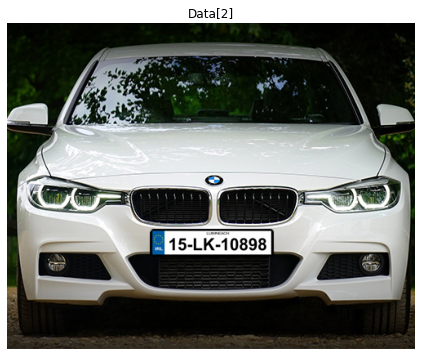

In [18]:
display(Xuntilted[2],"Data[2]")

In [19]:
output_img, plate = detect_plate(Xuntilted[2])

DimentionPredict: [[185 254 146  37]
 [149 288 190  48]]


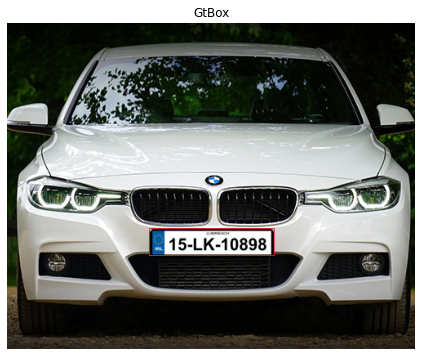

In [20]:
a=cv2.rectangle(Xuntilted[2], (174,252), (327, 285), (37,37,245), 1)
display(a,"GtBox")

In [21]:
gt_box = [174, 252, 327-174, 285-252]
pred_box = [185, 254, 146, 37]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.7277235906761448 4402 6049


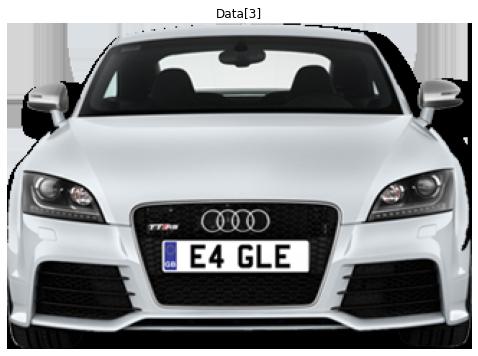

In [194]:
display(Xuntilted[3],"Data[3]")

In [195]:
# for i in range(len(Xuntilted)):
#     print("Pic:",i)
#     output_img, plate = detect_plate(Xuntilted[i])

In [196]:
output_img, plate = detect_plate(Xuntilted[3])

DimentionPredict: [[101 156 125  31]]


In [24]:
gt_box = [108, 151, 209-108, 174-151]
pred_box = [101, 156, 125, 31]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.41506849315068495 1818 4380


[]

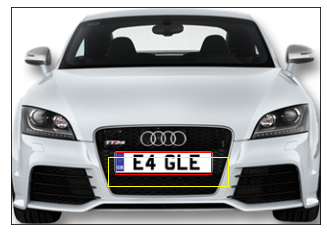

In [25]:
import imageio
import matplotlib.pyplot
import matplotlib.patches
im = imageio.imread("Cars192.png")
gt_box = [108, 151, 209-108, 174-151]
pred_box = [101, 156, 125, 31]
fig, ax = matplotlib.pyplot.subplots(1)
ax.imshow(im)

gt_rect = matplotlib.patches.Rectangle((gt_box[0], gt_box[1]),
                                       gt_box[2],
                                       gt_box[3],
                                       linewidth=1,
                                       edgecolor='r',
                                       facecolor='none')

pred_rect = matplotlib.patches.Rectangle((pred_box[0], pred_box[1]),
                                         pred_box[2],
                                         pred_box[3],
                                         linewidth=1,
                                         edgecolor=(1, 1, 0),
                                         facecolor='none')
ax.add_patch(gt_rect)
ax.add_patch(pred_rect)

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

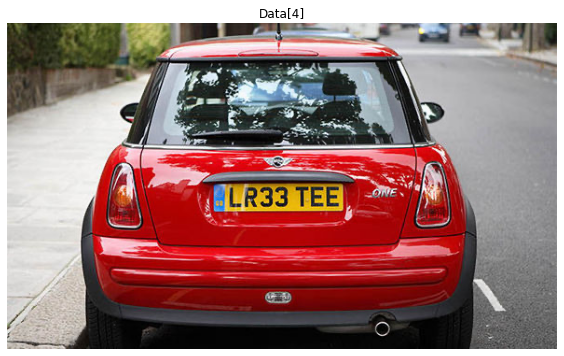

In [26]:
display(Xuntilted[4],"Data[4]")

In [197]:
output_img, plate = detect_plate(Xuntilted[4])

DimentionPredict: [[235 172 130  32]]


In [27]:
gt_box = [221, 172, 360-221, 202-172]
pred_box = [235, 172, 130, 32]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.8187772925764192 3750 4580


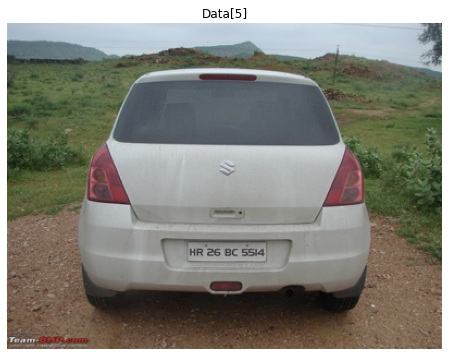

In [28]:
display(Xuntilted[5],"Data[5]")

In [198]:
output_img, plate = detect_plate(Xuntilted[5])

DimentionPredict: [[162 201  87  22]
 [ 71 182 180  45]]


In [201]:
gt_box = [165, 202, 236-165, 218-202]
pred_box = [162 , 201   , 87    , 22]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.593521421107628 1136 1914


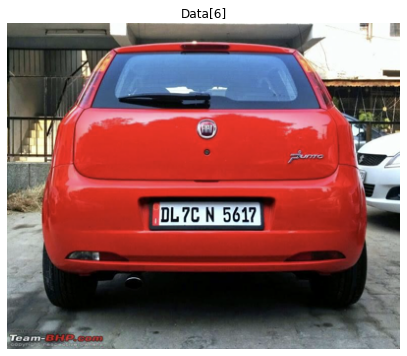

In [172]:
display(Xuntilted[6],"Data[6]")

In [173]:
output_img, plate = detect_plate(Xuntilted[6])

DimentionPredict: [[155 183 104  26]]


In [202]:
gt_box = [148, 182, 259-148, 209-182]
pred_box = [155, 183, 104, 26]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.9022355689022356 2704 2997


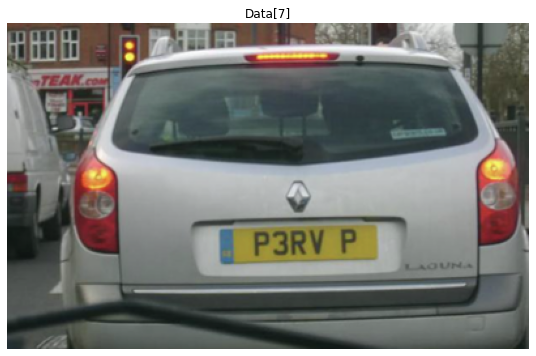

In [34]:
display(Xuntilted[8],"Data[7]")

In [35]:
output_img, plate = detect_plate(Xuntilted[8])

DimentionPredict: [[128 149 171  43]]


In [186]:
gt_box = [163, 157, 284-163, 180-157]
pred_box = [128, 149 , 171, 43]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.37848497212022303 2783 7353


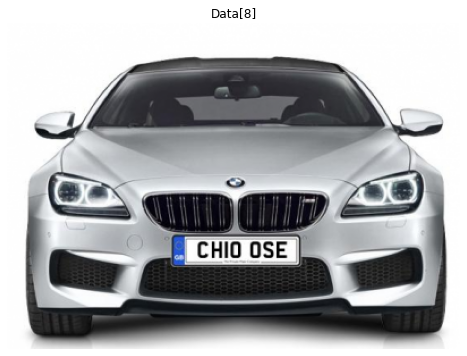

In [203]:
display(Xuntilted[9],"Data[8]")

In [38]:
output_img, plate = detect_plate(Xuntilted[9])

DimentionPredict: [[149 188 113  28]]


In [204]:
gt_box = [145, 188, 256-145, 214-188]
pred_box = [149 , 188  , 113  , 28]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.8512851897184822 2782 3268


In [205]:
output_img, plate = detect_plate(Xuntilted[10])

DimentionPredict: [[205 105 117  29]]


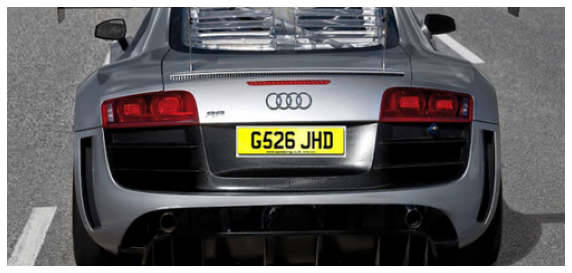

In [206]:
display(Xuntilted[10])

In [207]:
gt_box = [206, 109, 303-206, 133-109]
pred_box = [205, 105, 117, 29]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.6861184792219275 2328 3393


In [229]:
output_img, plate = detect_plate(Xuntilted[7])

DimentionPredict: [[169 197 160  40]]


[]

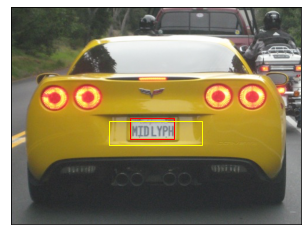

In [40]:
import imageio
import matplotlib.pyplot
import matplotlib.patches
im = imageio.imread("Cars36.png")
gt_box = [206, 191, 281-206, 227-191]
pred_box = [169, 197, 160, 40]
fig, ax = matplotlib.pyplot.subplots(1)
ax.imshow(im)

gt_rect = matplotlib.patches.Rectangle((gt_box[0], gt_box[1]),
                                       gt_box[2],
                                       gt_box[3],
                                       linewidth=1,
                                       edgecolor='r',
                                       facecolor='none')

pred_rect = matplotlib.patches.Rectangle((pred_box[0], pred_box[1]),
                                         pred_box[2],
                                         pred_box[3],
                                         linewidth=1,
                                         edgecolor=(1, 1, 0),
                                         facecolor='none')
ax.add_patch(gt_rect)
ax.add_patch(pred_rect)

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

In [41]:
output_img, plate = detect_plate(Xuntilted[11])

DimentionPredict: [[167 222 112  28]]


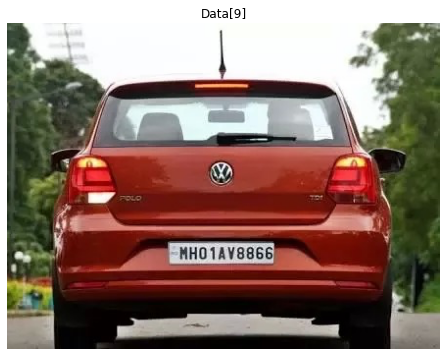

In [42]:
display(Xuntilted[11],"Data[9]")

In [210]:
gt_box = [166, 224, 272-166, 246-224]
pred_box = [167 , 222 , 112  , 28]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.7314756174794174 2310 3158


In [46]:
gt_box = [205, 107, 301-205, 131-107]
pred_box = [205, 105, 117, 29]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.6790450928381963 2304 3393


In [48]:
# [[128 149 171  43]]

In [49]:
gt_box = [162, 156, 283-162, 180-156]
pred_box = [128, 149, 171, 43]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.3949408404732762 2904 7353


In [50]:
Xtilted = [cv2.imread(file) for file in glob.glob("C:/Users/user/OneDrive/Desktop/New/car/tilted/*.png")]

In [51]:
output_img, plate = detect_plate(Xtilted[0])

DimentionPredict: [[312 166 165  41]
 [318 121 147  37]]


In [52]:
for i in range(len(Xtilted)):
    try:
        output_img, plate = detect_plate(Xtilted[i])
    except:
        print(i,'###')
        pass

DimentionPredict: [[318 121 147  37]
 [312 166 165  41]]
DimentionPredict: ()
1 ###
DimentionPredict: ()
2 ###
DimentionPredict: ()
3 ###
DimentionPredict: ()
4 ###
DimentionPredict: [[249 194  68  17]]
DimentionPredict: [[135 126 141  35]]
DimentionPredict: [[224 181 116  29]]
DimentionPredict: ()
8 ###
DimentionPredict: ()
9 ###
DimentionPredict: ()
10 ###
DimentionPredict: ()
11 ###
DimentionPredict: ()
12 ###
DimentionPredict: ()
13 ###


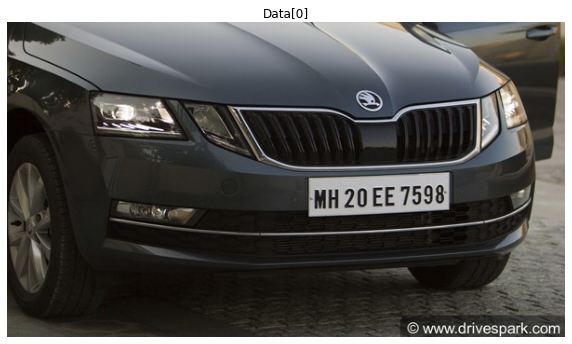

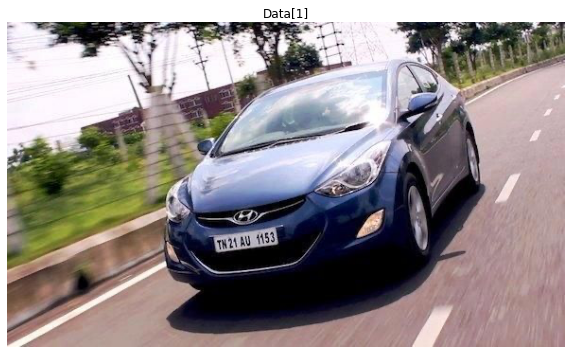

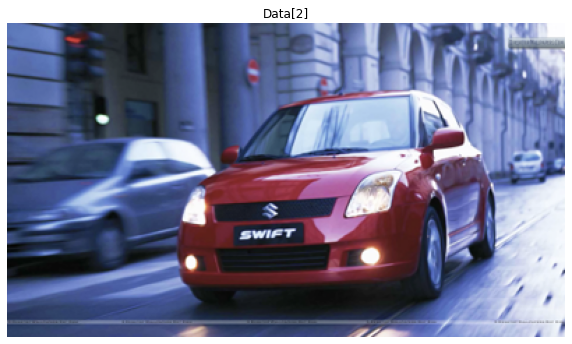

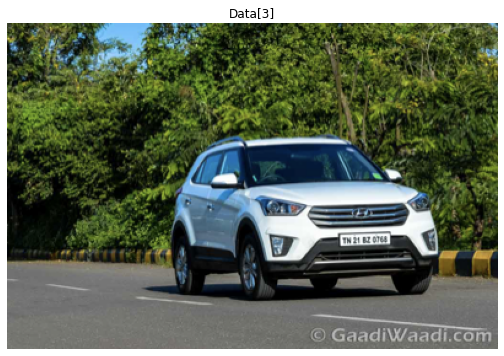

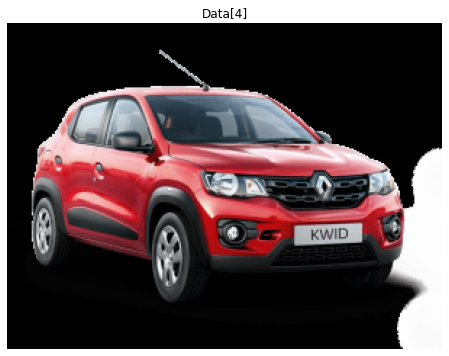

...

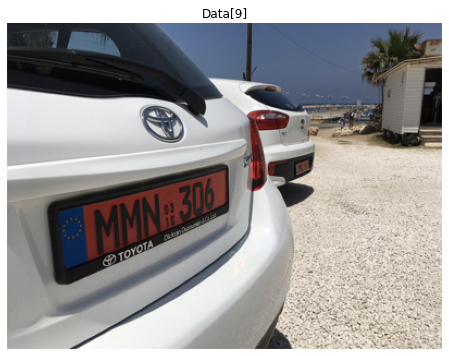

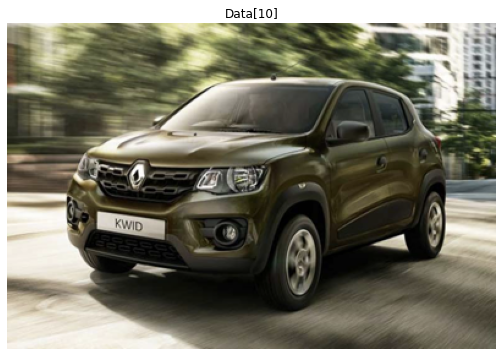

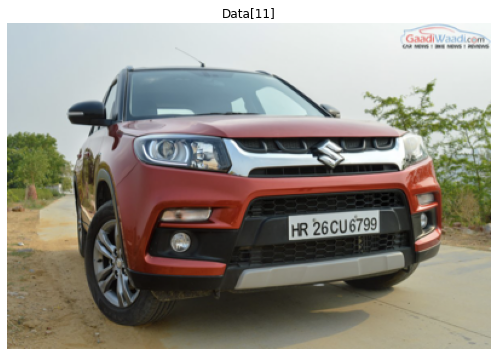

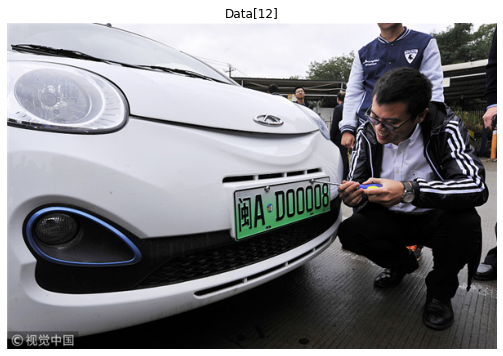

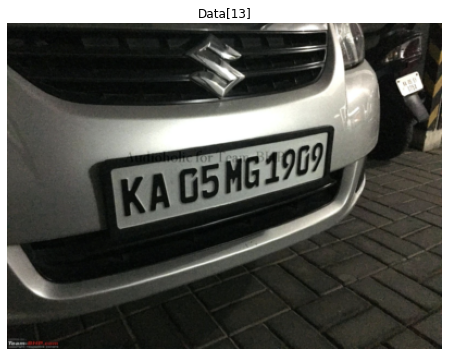

In [53]:
for i in range(len(Xtilted)):
    display(Xtilted[i],"Data["+str(i)+"]")

In [54]:
#224 181 116  29
gt_box = [226, 181, 324-226, 207-181]
pred_box = [224, 181, 116, 29]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.7574316290130797 2548 3364


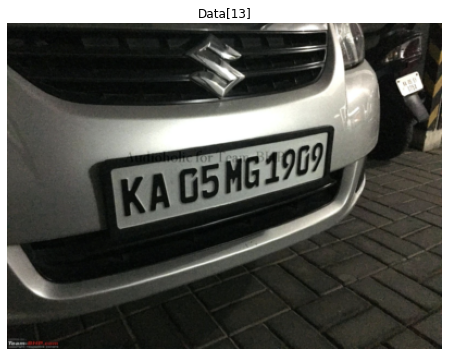

In [55]:
display(Xtilted[13],"Data["+str(13)+"]")

In [56]:
# [[135 126 141  35]]
gt_box = [142, 128, 257-142, 155-128]
pred_box = [135, 126, 141, 35]
iou, intersect, union = intersection_over_union(gt_box, pred_box)
print(iou, intersect, union)

0.6291793313069909 3105 4935


[]

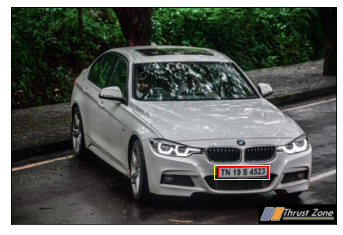

In [57]:
import imageio
import matplotlib.pyplot
import matplotlib.patches
im = imageio.imread("Cars226.png")
gt_box = [254, 195, 315-254, 208-195]
pred_box = [249, 194, 68, 17]
fig, ax = matplotlib.pyplot.subplots(1)
ax.imshow(im)

gt_rect = matplotlib.patches.Rectangle((gt_box[0], gt_box[1]),
                                       gt_box[2],
                                       gt_box[3],
                                       linewidth=1,
                                       edgecolor='r',
                                       facecolor='none')

pred_rect = matplotlib.patches.Rectangle((pred_box[0], pred_box[1]),
                                         pred_box[2],
                                         pred_box[3],
                                         linewidth=1,
                                         edgecolor=(1, 1, 0),
                                         facecolor='none')
ax.add_patch(gt_rect)
ax.add_patch(pred_rect)

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

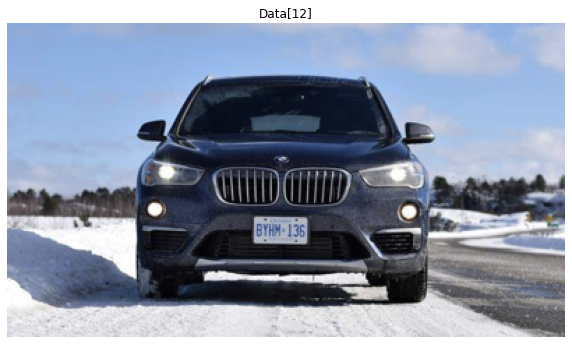

In [58]:
img11 = cv2.imread("Cars25.png")
display(img11,"Data["+"12"+"]")

In [348]:
def detect_plate(img, text=''):
    plate_img = img.copy()
    roi = img.copy()
    plate_rect = [[166, 224, 272-166, 246-224]]
    for (x,y,w,h) in plate_rect:
        roi_ = roi[y:y+h, x:x+w, :]
        plate = roi[y:y+h, x:x+w, :]
        cv2.rectangle(plate_img, (x+2,y), (x+w-3, y+h-5), (51,181,155), 1)
    
    if text!='':
        plate_img = cv2.putText(plate_img, text, (x-w//2,y-h//2), 
                                cv2.FONT_HERSHEY_COMPLEX_SMALL , 0.5, (51,181,155), 1, cv2.LINE_AA)
        
    return plate_img, plate 

In [349]:
output_img, plate = detect_plate(Xuntilted[11])

In [350]:
def find_contours(dimensions, img) :
    
    # Find all contours in the image
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # Retrieve potential dimensions
    lower_width = dimensions[0]
    upper_width = dimensions[1]
    lower_height = dimensions[2]
    upper_height = dimensions[3]

    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]
    
    ii = cv2.imread('contour.jpg')
    
    x_cntr_list = []
    target_contours = []
    img_res = []
    for cntr in cntrs :
        # detects contour in binary image and returns the coordinates of rectangle enclosing it
        intX, intY, intWidth, intHeight = cv2.boundingRect(cntr)
        
        # checking the dimensions of the contour to filter out the characters by contour's size
        if intWidth > lower_width and intWidth < upper_width and intHeight > lower_height and intHeight < upper_height :
            x_cntr_list.append(intX) #stores the x coordinate of the character's contour, to used later for indexing the contours

            char_copy = np.zeros((44,24))
            # extracting each character using the enclosing rectangle's coordinates.
            char = img[intY:intY+intHeight, intX:intX+intWidth]
            char = cv2.resize(char, (20, 40))
            
            cv2.rectangle(ii, (intX,intY), (intWidth+intX, intY+intHeight), (50,21,200), 2)
            plt.imshow(ii, cmap='gray')

            # Make result formatted for classification: invert colors
            char = cv2.subtract(255, char)

            # Resize the image to 24x44 with black border
            char_copy[2:42, 2:22] = char
            char_copy[0:2, :] = 0
            char_copy[:, 0:2] = 0
            char_copy[42:44, :] = 0
            char_copy[:, 22:24] = 0

            img_res.append(char_copy) # List that stores the character's binary image (unsorted)
            
    # Return characters on ascending order with respect to the x-coordinate (most-left character first)
            
    plt.show()
    # arbitrary function that stores sorted list of character indeces
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res_copy = []
    for idx in indices:
        img_res_copy.append(img_res[idx])# stores character images according to their index
    img_res = np.array(img_res_copy)

    return img_res

In [351]:
def segment_characters(image) :
    t1_start = perf_counter()
    # Preprocess cropped license plate image
    img_lp = cv2.resize(image, (333, 75))
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    img_binary_lp = cv2.erode(img_binary_lp, (3,3))
    img_binary_lp = cv2.dilate(img_binary_lp, (3,3))

    LP_WIDTH = img_binary_lp.shape[0]
    LP_HEIGHT = img_binary_lp.shape[1]

    # Make borders white
    img_binary_lp[0:3,:] = 255
    img_binary_lp[:,0:3] = 255
    img_binary_lp[72:75,:] = 255
    img_binary_lp[:,330:333] = 255

    # Estimations of character contours sizes of cropped license plates
    dimensions = [LP_WIDTH/6,
                       LP_WIDTH/2,
                       LP_HEIGHT/10,
                       2*LP_HEIGHT/3]
    plt.imshow(img_binary_lp, cmap='gray')
    plt.show()
    cv2.imwrite('contour.jpg',img_binary_lp)

    # Get contours within cropped license plate
    char_list = find_contours(dimensions, img_binary_lp)
    t1_stop = perf_counter()
    print("Elapsed time:", (t1_stop-t1_start))
    return char_list

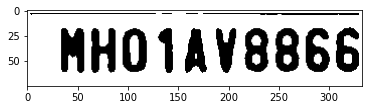

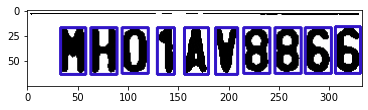

Elapsed time: 0.22509790000185603


In [352]:
char = segment_characters(plate)

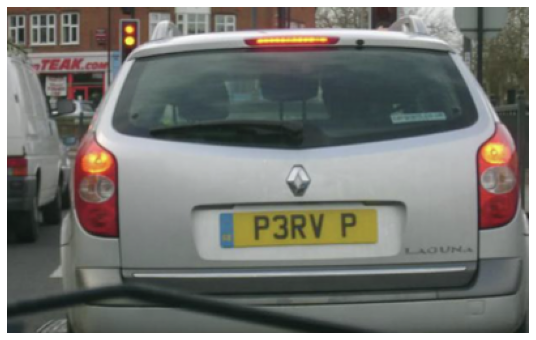

In [185]:
display(Xuntilted[8])

Elapsed time: 7.12280000152532
DimentionPredict: [[134 123 130  33]]


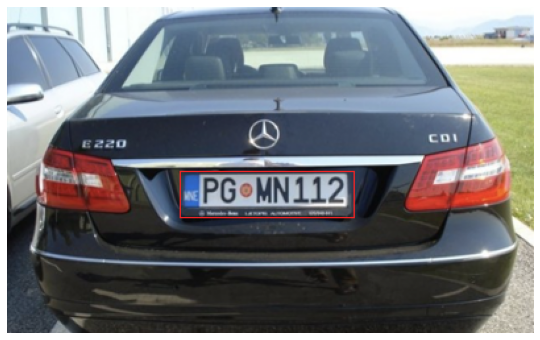

Elapsed time: 9.442099999432685
DimentionPredict: [[125 205 151  38]
 [103 114 223  56]]


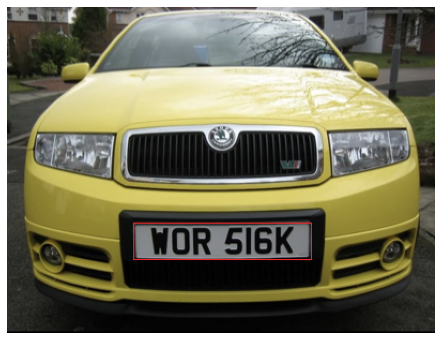

Elapsed time: 26.011000001744833
DimentionPredict: [[180 255 142  35]
 [150 287 193  49]]


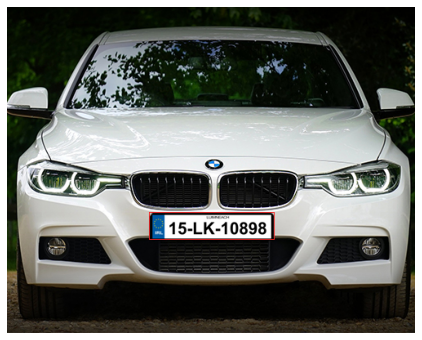

Elapsed time: 5.0278999988222495
DimentionPredict: [[101 156 125  31]]


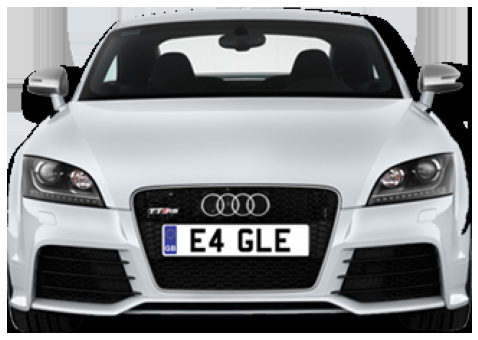

Elapsed time: 11.304499999823747
DimentionPredict: [[235 172 130  32]]


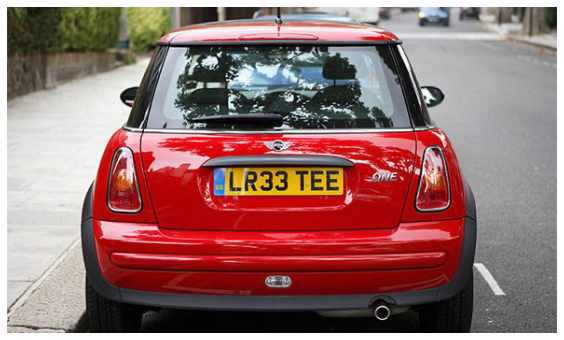

Elapsed time: 6.821399998443667
DimentionPredict: [[162 201  87  22]
 [ 71 182 180  45]]


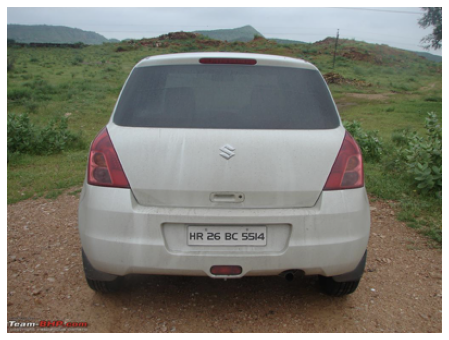

Elapsed time: 7.7485000001615845
DimentionPredict: [[155 183 104  26]]


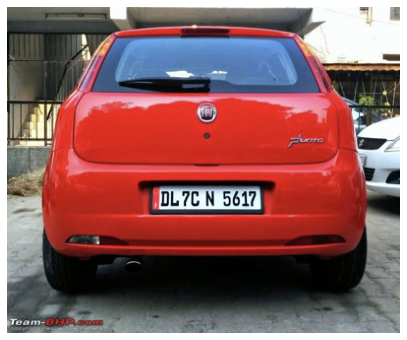

Elapsed time: 9.77489999786485
DimentionPredict: [[169 197 160  40]]


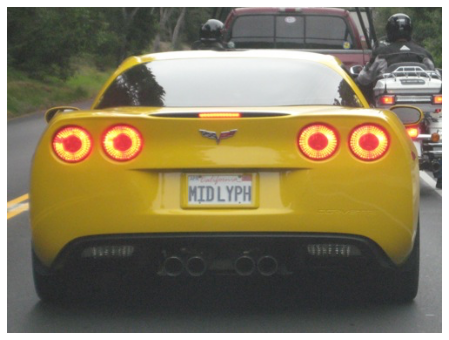

Elapsed time: 6.500799998320872
DimentionPredict: [[128 149 171  43]]


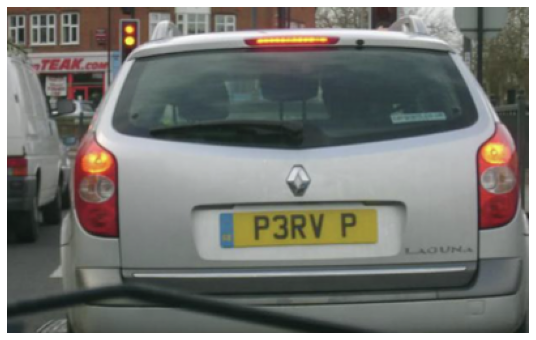

Elapsed time: 6.947899997612694
DimentionPredict: [[149 188 113  28]]


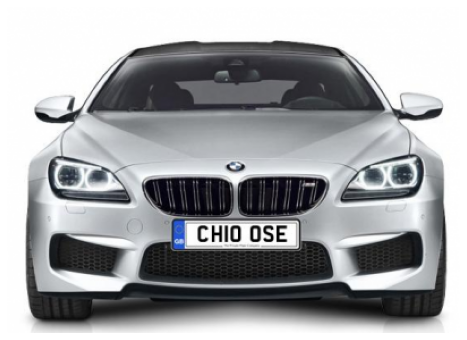

Elapsed time: 6.037999999534804
DimentionPredict: [[205 105 117  29]]


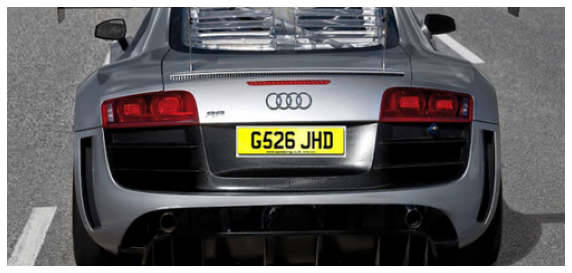

Elapsed time: 9.384199998748954
DimentionPredict: [[167 222 112  28]]


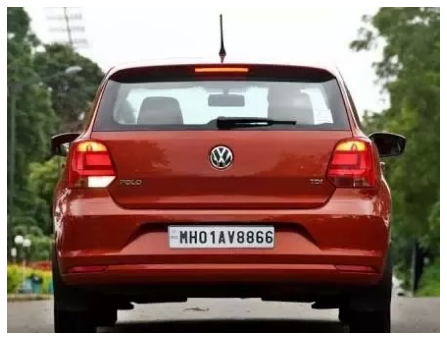

In [295]:
for i in range(len(Xuntilted)):
    output_img, plate = detect_plate(Xuntilted[i])
    display(Xuntilted[i])

In [265]:
img= cv2.imread("Cars36.png")
plate_rect = plate_cascade.detectMultiScale(img, scaleFactor = 1.2, minNeighbors = 7)

In [266]:
plate_rect

array([[169, 197, 160,  40]])

In [354]:
pred_box = [169, 197, 160, 40]